In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import matplotlib as mpl

from tqdm import trange, notebook
from tqdm.notebook import tqdm
from numba import jit
from mpl_toolkits.mplot3d import Axes3D
from collections import Counter
import itertools
import sys
sys.path.append(os.path.abspath('../scripts'))
from my_utilities import *

C:\Users\Roozbeh\Anaconda3\envs\similarity_matching\lib\site-packages\statsmodels\tools\_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
notebook.tqdm.pandas()

C:\Users\Roozbeh\Anaconda3\envs\similarity_matching\lib\site-packages\tqdm\std.py:658: FutureWarning: The Panel class is removed from pandas. Accessing it from the top-level namespace will also be removed in the next version
  from pandas import Panel


In [3]:
data_path_base = r"../data/"

In [4]:
morningdf_no_nan = pd.read_parquet(os.path.join(data_path_base, r"koln_morning_dataframe.parquet"))
# ODdf.columns = ['orig time','orig x','orig y','orig spd','dest time','dest x','dest y','dest spd']

In [5]:
morning50df = pd.read_parquet(os.path.join(data_path_base,r'morning_trips_df_with_50points.parquet'))

In [6]:
xmax = morningdf_no_nan.x.max()
xmin = morningdf_no_nan.x.min()
ymax = morningdf_no_nan.y.max()
ymin = morningdf_no_nan.y.min()
tmax = morningdf_no_nan.time.max()
tmin = morningdf_no_nan.time.min()

In [7]:
morningdf_no_nan

,time,trip_id,x,y,spd
8484331,21571.0,1401792,22056.400000,17311.490000,0.00
8484575,21571.0,336633,13315.950000,12687.650000,0.00
8484627,21571.0,634311,17555.460000,16582.760000,0.00
8485512,21571.0,1104353,20378.930000,20609.890000,0.00
8485641,21571.0,23620,22693.530000,6839.980000,0.00
...,...,...,...,...,...
115788320,36029.0,1159596,20881.964570,8171.417369,22.02
115788351,36029.0,169979,13888.929325,24502.642987,3.65
115788850,36029.0,1208490,15614.362823,12468.408416,4.56
115788966,36029.0,1534301,11829.848768,13325.926609,13.22


In [8]:
morning50df.time = (morning50df.time - tmin)/(tmax - tmin)

In [9]:
morning50df

,point_index,time,x,y,spd
trip_id,,,,,
1000007,0,0.361530,0.684278,0.570806,0.00
1000007,1,0.361945,0.685274,0.571578,9.74
1000007,2,0.363328,0.694287,0.576280,11.37
1000007,3,0.363882,0.694457,0.573746,13.45
1000007,4,0.364504,0.690615,0.570789,13.36
...,...,...,...,...,...
769414,45,0.445566,0.478249,0.422410,0.00
769414,46,0.447019,0.470983,0.421721,13.19
769414,47,0.447503,0.467166,0.421616,13.08


##### Parameters Section

In [10]:
space_threshold = 0.05*1 #area is roughly 20x20km so let's say distance 1 = 20km => 0.05 = 1km
                           

time_threshold = 2*600/(tmax - tmin) #1200 seconds (20 min) 

w_t = 0.5
w_x = 1 - w_t

##### We get a sample  2000 for the requests

In [11]:
ODdf = pd.read_parquet('ODdf_forcarpoolv2') #from CaR_V2 (non comparison) notebook created file

In [59]:
ODdf = ODdf[ODdf['displacement(km)']>=5]

To be consistent with OD only case:

In [65]:
ODridersDF = ODdf.sample(n=20000,random_state=12345)

ODridesDF = ODdf[~ ODdf.index.isin(ODridersDF.index)]

In [66]:
ODridersDF

,orig time,orig x,orig y,dest time,dest x,dest y,timediff(h),displacement(km)
trip_id,,,,,,,,
1179462,0.142689,0.693717,0.724518,0.204247,0.755933,0.244484,0.247222,9.680982
152567,0.172430,0.792008,0.191919,0.289113,0.420879,0.660365,0.468611,11.952870
1289340,0.244916,0.179569,0.884439,0.331443,0.371738,0.423848,0.347500,9.981449
329072,0.704454,0.617728,0.462618,0.738000,0.776894,0.262257,0.134722,5.117739
1009349,0.924955,0.322243,0.114036,0.973786,0.372877,0.370159,0.196111,5.221600
...,...,...,...,...,...,...,...,...
1115610,0.777009,0.822521,0.222099,0.832964,0.389725,0.416727,0.224722,9.490878
1535849,0.745677,0.623465,0.191317,0.777701,0.311165,0.214286,0.128611,6.262860
212697,0.186817,0.244353,0.720329,0.265597,0.407476,0.460706,0.316389,6.132304


In [169]:
# np.random.seed(12345)
# req_trip_ids = np.random.choice(morning50df.index.unique().values, size=20000, replace=False)

In [67]:
ridersDF = morning50df[morning50df.index.isin(ODridersDF.index)]
ridesDF = morning50df[morning50df.index.isin(ODridesDF.index)]

In [68]:
ridersDF

,point_index,time,x,y,spd
trip_id,,,,,
1000007,0,0.361530,0.684278,0.570806,0.00
1000007,1,0.361945,0.685274,0.571578,9.74
1000007,2,0.363328,0.694287,0.576280,11.37
1000007,3,0.363882,0.694457,0.573746,13.45
1000007,4,0.364504,0.690615,0.570789,13.36
...,...,...,...,...,...
729913,45,0.900885,0.657699,0.527753,21.91
729913,46,0.901231,0.659374,0.525252,13.23
729913,47,0.901854,0.662839,0.524351,13.63


In [69]:
ridesDF

,point_index,time,x,y,spd
trip_id,,,,,
1000043,0,0.514525,0.290940,0.355618,0.000000
1000043,1,0.515701,0.294347,0.358396,7.930000
1000043,2,0.515977,0.295113,0.359141,7.750000
1000043,3,0.516461,0.295556,0.360842,8.100000
1000043,4,0.522548,0.331461,0.370715,24.860001
...,...,...,...,...,...
769414,45,0.445566,0.478249,0.422410,0.000000
769414,46,0.447019,0.470983,0.421721,13.190000
769414,47,0.447503,0.467166,0.421616,13.080000


----------

In [45]:
def is_within_threshold(df1, df2, time_threshold, space_threshold): 
    '''
        df1 = rider
        df2 = ride
        ride must begin after rider, and end before rider.
        df columns: point_index, time, x, y, spd
        df index: trip_id
    '''
    t1_o, x1_o, y1_o = df1.iloc[0,1:4]
    t1_d, x1_d, y1_d = df1.iloc[-1,1:4]
    t2_o, x2_o, y2_o = df2.iloc[0,1:4]
    t2_d, x2_d, y2_d = df2.iloc[-1,1:4]
    
    oo_dist = np.sqrt(np.square(x1_o - x2_o)+np.square(y1_o - y2_o))
    if oo_dist > space_threshold:
        return False
    
    dd_dist = np.sqrt(np.square(x1_d - x2_d)+np.square(y1_d - y2_d))
    if dd_dist > space_threshold:
        return False
    
    oo_time = t2_o - t1_o
    if oo_time < 0 or oo_time > time_threshold:
        return False
    
    dd_time = t1_d - t2_d
    if dd_time < 0 or dd_time > time_threshold:
        return False
    
    return True

In [70]:
def get_candidates_within_thresholds(df1, origins, destinations, space_threshold, time_threshold):
    
    oo_times = origins.time - df1['time'].iloc[0]
    origins = origins[(oo_times>=0) & (oo_times <= time_threshold)]
    
    oo_dist = np.sqrt( (origins.x - df1.x.iloc[0]) ** 2 + (origins.y - df1.y.iloc[0])**2 )
    origins = origins[oo_dist <= space_threshold]
    if origins.empty:
        return []
    destinations = destinations[destinations.index.isin(origins.index)]
    
    dd_times = df1['time'].iloc[-1] - destinations.time
    destinations = destinations[(dd_times >= 0) & (dd_times <= time_threshold)]
    
    dd_dist = np.sqrt( (destinations.x - df1.x.iloc[-1]) ** 2 + (destinations.y - df1.y.iloc[-1])**2 )
#     destinations = destinations[dd_dist <= space_threshold]
    
    return destinations[dd_dist <= space_threshold].index.values

In [71]:
import numba 
from numba import jit

#weighted geometric mean between time and space. arithmetic mean between origin and dest (/2).
@numba.jit(nopython=True)
def get_wgm_similarity_50pt(arr1, arr2, w_x = 0.5, w_t = 0.5):
    '''
        arr1 and arr2 shape must be (50, 5) as in the DF.values 
    '''
#     if w_x + w_t != 1:
#         raise Exception("sum of w_x and w_t must be 1")
#     if len(df1) != 50 or len(df2) != 50:
#         raise Exception('df1 or df2 has a none 50 length')
        
    pairwise_dists = np.sqrt( np.square(arr1[:,2] - arr2[:,2]) + np.square(arr1[:,3] - arr2[:,3]) )
    pairwise_times = np.absolute(arr1[:,1] - arr2[:,1])
    pairwise_similarities = np.exp(w_x * np.log(1./(1+pairwise_dists)) + w_t * np.log(1./(1+pairwise_times)) )
    
    return np.mean(pairwise_similarities)
    

In [72]:
riders_df_list = list(ridersDF.groupby('trip_id'))

In [96]:
riders_df_dict = {}
for name, df in ridersDF.groupby('trip_id'):
    riders_df_dict[name] = df

In [73]:
rides_df_dict = {}
for name, df in ridesDF.groupby('trip_id'):
    rides_df_dict[name] = df

In [28]:
# rides_groupby = ridesDF.groupby('trip_id')

In [53]:
np.apply_along_axis(lambda x: x, axis=0, arr=df1.index.values)

array(['100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080', '100080', '100080', '100080', '100080',
       '100080', '100080'], dtype=object)

In [82]:
matches = dict()
threshold_multiplier = 4
t_thresh = threshold_multiplier * time_threshold
s_thresh = threshold_multiplier * space_threshold
origins = ridesDF[ridesDF.point_index==0]
destinations = ridesDF[ridesDF.point_index==49]
for name1, df1 in tqdm(riders_df_list):
    df1_od = df1.iloc[[0,-1],:]
    candidates_pd_index =  get_candidates_within_thresholds(df1_od,
                                                           origins,
                                                           destinations,
                                                           s_thresh,
                                                           t_thresh)
    
    matches[name1] = list(map(lambda name2: (name2,get_wgm_similarity_50pt(df1.values, rides_df_dict[name2].values, w_x, w_t)),candidates_pd_index))
#     for name2 in candidates_pd_index:
# #         df2 = rides_groupby.get_group(name2)  
#         candidates.append(( name2  , get_wgm_similarity_50pt(df1.to_numpy(), rides_df_dict[name2].to_numpy(), w_x, w_t) ))
#     matches[name1] = candidates 

In [348]:
count = 0
for k,v in matches.items():
    if len(v) >= 4:
        count += 1
print(count)

12731


In [83]:
matches

{'1000007': [('1279620', 0.9655102950107971),
  ('1336714', 0.961534070172166),
  ('1384526', 0.9595779266071495),
  ('1423632', 0.9832053741677461),
  ('160281', 0.9664313231662983),
  ('267170', 0.9259565434302158)],
 '1000015': [('1007841', 0.9397675498624583),
  ('1029805', 0.9488581123026997),
  ('1054191', 0.9495190029099331),
  ('1061428', 0.9522131955940142),
  ('1068734', 0.9766692423778055),
  ('1125016', 0.9784325771630624),
  ('1152011', 0.9235122538805021),
  ('116564', 0.9318756448875781),
  ('11762', 0.963871578413795),
  ('1217325', 0.9504281460325373),
  ('1258574', 0.954052263485039),
  ('1259141', 0.9723380961143425),
  ('1265671', 0.9402640027391052),
  ('1287174', 0.9424266506751331),
  ('1298610', 0.9753964978515067),
  ('1310474', 0.9735103866404781),
  ('1392302', 0.9768613430800164),
  ('141840', 0.9719654799004438),
  ('1477644', 0.9592706937867322),
  ('1510672', 0.9411347710081571),
  ('1528499', 0.9672915546581329),
  ('1529388', 0.9776181865544309),
  ('15

----------------
#### DEFINING SIMILARITIES

In [202]:
@numba.jit(nopython=True)
def is_equal(x,y):
    dist = np.sqrt((x[0] - y[0]) ** 2 + (x[1] - y[1])**2 )
    t = np.absolute(x[2]-y[2])
#     print('hi')
    return (dist <= space_threshold) and (t <= time_threshold)

In [203]:
@numba.jit(nopython=True)
def lcs(X , Y):
    # find the length of the strings
    m = 50
    n = 50
    # declaring the array for storing the dp values
#     L = [[None]*(n+1) for i in range(m+1)]
    L = np.zeros((m+1,n+1),dtype=np.int32)
 
    """Following steps build L[m+1][n+1] in bottom up fashion
    Note: L[i][j] contains length of LCS of X[0..i-1]
    and Y[0..j-1]"""
    for i in range(1,m+1):
        for j in range(1,n+1):
#             print(i,j)
#             if i == 0 or j == 0 :
#                 L[i][j] = 0
            if is_equal(X[i-1],Y[j-1]):
                L[i,j] = L[i-1,j-1] + 1
            else:
                L[i,j] = L[i-1,j]
                if L[i,j] < L[i, j-1]:
                    L[i,j] = L[i,j-1]
 
    # L[m][n] contains the length of LCS of X[0..n-1] & Y[0..m-1]
    return L[m][n]

In [204]:
# @numba.jit(forceobj=True)
@numba.jit(nopython=True)
def get_LCSS_similarity_50pt(arr1, arr2):
    '''
        arr1 and arr2 shape must be (50, 5) as in the DF.values 
    '''
    return lcs(arr1[:,[2,3,1]], arr2[:,[2,3,1]])
#     X = [(t1[i],t1[i+50],t1[i+100]) for i in range(1,51)]
#     Y = [(t2[i],t2[i+50],t2[i+100]) for i in range(1,51)]
#     l = lcs(X,Y)

#     return(l)

In [205]:
LCSS_matches = {}
for name1, candidates in tqdm(matches.items()):
    if not candidates:
        continue
    
    name2s, wgm_sims = zip(*candidates)
    df1 = riders_df_dict[name1].values
    LCSS_matches[name1] = list(map(lambda name2: (name2, lcs(df1[:,[2,3,1]], rides_df_dict[name2].values[:,[2,3,1]])),
         name2s))

In [206]:
LCSS_matches

{'1000007': [('1279620', 21),
  ('1336714', 20),
  ('1384526', 23),
  ('1423632', 41),
  ('160281', 22),
  ('267170', 0)],
 '1000015': [('1007841', 5),
  ('1029805', 3),
  ('1054191', 9),
  ('1061428', 13),
  ('1068734', 41),
  ('1125016', 37),
  ('1152011', 0),
  ('116564', 0),
  ('11762', 32),
  ('1217325', 10),
  ('1258574', 20),
  ('1259141', 36),
  ('1265671', 0),
  ('1287174', 15),
  ('1298610', 36),
  ('1310474', 37),
  ('1392302', 42),
  ('141840', 35),
  ('1477644', 32),
  ('1510672', 12),
  ('1528499', 23),
  ('1529388', 42),
  ('1533420', 47),
  ('1552112', 10),
  ('1553630', 9),
  ('16373', 17),
  ('165757', 42),
  ('181897', 4),
  ('198932', 11),
  ('206498', 4),
  ('234536', 11),
  ('256544', 16),
  ('257851', 34),
  ('264019', 0),
  ('284159', 31),
  ('390087', 43),
  ('414922', 29)],
 '1000038': [('1138190', 0),
  ('11597', 43),
  ('1160613', 36),
  ('1216278', 16),
  ('1228407', 0),
  ('1296253', 23),
  ('1327130', 7),
  ('1344536', 29),
  ('1355892', 5),
  ('1461340',

In [260]:
matches

{'1000007': [('1279620', 0.9655102950107971),
  ('1336714', 0.961534070172166),
  ('1384526', 0.9595779266071495),
  ('1423632', 0.9832053741677461),
  ('160281', 0.9664313231662983),
  ('267170', 0.9259565434302158)],
 '1000015': [('1007841', 0.9397675498624583),
  ('1029805', 0.9488581123026997),
  ('1054191', 0.9495190029099331),
  ('1061428', 0.9522131955940142),
  ('1068734', 0.9766692423778055),
  ('1125016', 0.9784325771630624),
  ('1152011', 0.9235122538805021),
  ('116564', 0.9318756448875781),
  ('11762', 0.963871578413795),
  ('1217325', 0.9504281460325373),
  ('1258574', 0.954052263485039),
  ('1259141', 0.9723380961143425),
  ('1265671', 0.9402640027391052),
  ('1287174', 0.9424266506751331),
  ('1298610', 0.9753964978515067),
  ('1310474', 0.9735103866404781),
  ('1392302', 0.9768613430800164),
  ('141840', 0.9719654799004438),
  ('1477644', 0.9592706937867322),
  ('1510672', 0.9411347710081571),
  ('1528499', 0.9672915546581329),
  ('1529388', 0.9776181865544309),
  ('15

In [276]:
import pickle

In [278]:
with open('wgm_matches.pickle','wb') as f:
    pickle.dump(matches, f)

In [279]:
with open('lcss_matches.pickle','wb') as f:
    pickle.dump(LCSS_matches, f)

In [242]:
def get_total_point_by_point_dist_and_time(tripdf):
    '''
        get point by point travel and time in KM and sec
        (assuming 20km for scale of 1 and tmax-tmin for scale of 1 in time)
    '''
    nxt, cur = tripdf.iloc[1:,:], tripdf.iloc[:-1,:] #assuming it is sorted in point_index
    d = np.sum(np.sqrt(np.square((nxt.x-cur.x)*20) + np.square((nxt.y-cur.y)*20) ))
    t = np.sum(nxt.time - cur.time)
    return d,t*(tmax-tmin)

In [243]:
get_total_point_by_point_dist_and_time(rider)

(8.478708176750187, 767.9999999999998)

In [349]:
from operator import itemgetter

def get_measurements(match_dict, min_candidates_size=1):
    '''
        match_dict {rider_trip_id : [(match_ride_trip_id, sim), (match_ride_trip_id, sim), ...]}
        returns a dict of measurements
    '''
    
    OO_distances = []
    DD_distances = []
    OO_times = []
    DD_times = []
    ride_travel_distances = []
    ride_travel_times = []
    rider_travel_distances = []
    rider_travel_times = []
    for name1, list_of_matches in match_dict.items():
        if not list_of_matches or len(list_of_matches) < min_candidates_size:
            continue
        matched_ride = rides_df_dict[max(list_of_matches, key=itemgetter(1))[0]]
        rider = riders_df_dict[name1]
        d,t = get_total_point_by_point_dist_and_time(rider)
        rider_travel_distances.append(d)
        rider_travel_times.append(t)
        d,t = get_total_point_by_point_dist_and_time(matched_ride)
        ride_travel_distances.append(d)
        ride_travel_times.append(t)
        OO_distances.append(np.sqrt(np.square((rider.x.iloc[0]-matched_ride.x.iloc[0])*20) + np.square((rider.y.iloc[0]-matched_ride.y.iloc[0])*20)))
        OO_times.append(matched_ride.time.iloc[0] - rider.time.iloc[0])
        DD_distances.append(np.sqrt(np.square((rider.x.iloc[-1]-matched_ride.x.iloc[-1])*20) + np.square((rider.y.iloc[-1]-matched_ride.y.iloc[-1])*20)))
        DD_times.append(rider.time.iloc[-1] - matched_ride.time.iloc[-1])
    return {'oo_dist' : OO_distances, 'oo_time' : OO_times, 'dd_dist' : DD_distances, 'dd_time' : DD_times,
           'rider_dist' : rider_travel_distances, 'rider_time' : rider_travel_times,
           'match_dist' : ride_travel_distances, 'match_time' : ride_travel_times}


In [263]:
lcss_measurements = get_measurements(LCSS_matches)

In [264]:
mpl.rc('text', usetex=True)
mpl.rcParams['font.monospace'] = ['Computer Modern Typewriter','DejaVu Sans Mono','Bitstream Vera Sans Mono','Courier']
sns.set(style = 'darkgrid', context = 'paper', font_scale=4)
sns.set_palette("bright")
mpl.rcParams['font.family'] = ['monospace']

In [265]:
wgm_measurements = get_measurements(matches)

In [272]:
len(lcss_measurements['match_dist'])

16211

In [274]:
len(wgm_measurements['match_dist'])

16211

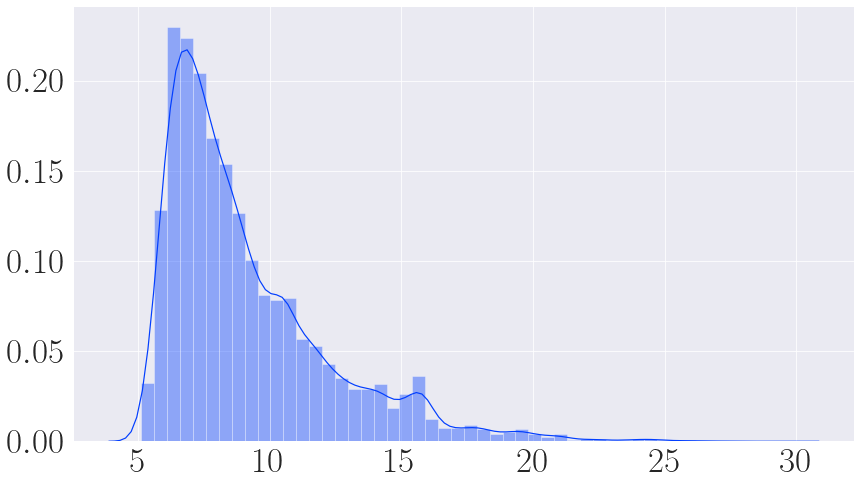

In [266]:
plt.figure(figsize=(14,8))
sns.distplot(lcss_measurements['match_dist'])

In [270]:
np.mean(lcss_measurements['match_dist'])

9.135306579721988

In [271]:
np.mean(wgm_measurements['match_dist'])

9.074939259905554

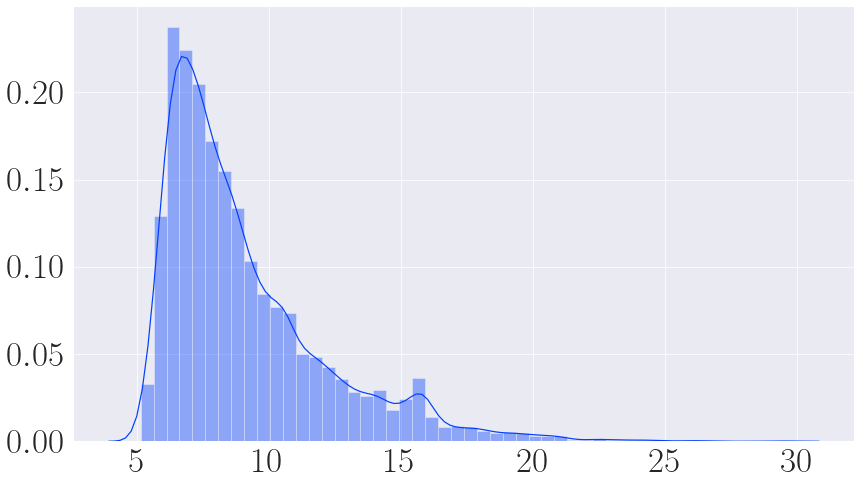

In [267]:
plt.figure(figsize=(14,8))
sns.distplot(wgm_measurements['match_dist'])

In [406]:
print("matching with time_threshold of {} and distance_threshold of {}".format(t_th,d_th) )

print("number of req with at least a match:",match_count)

print("match travels (km): ",np.sum(match_kms)/1000)

print("req travels (km): ",np.sum(req_kms)/1000)

print("req travels when they have at least one match (km):",np.sum(req_with_match_kms)/1000)

print("match/match+req ratio: ",np.sum(match_kms)/(np.sum(match_kms)+np.sum(req_kms)))

print("match/match+req with at least 1 match ratio: ",np.sum(match_kms)/(np.sum(match_kms)+np.sum(req_with_match_kms)))

print("origin-origin distance (km): ",np.sum(oo_kms)/1000)

print("dest-dest distance (km): ",np.sum(dd_kms)/1000)

print("origin-origin times (sec): ",np.sum(oo_times))

print("dest-dest times (sec): ",np.sum(dd_times))

matching with time_threshold of 900 and distance_threshold of 1800
number of req with at least a match: 1357
match travels (km):  5393.86139893
req travels (km):  11706.3341707
req travels when they have at least one match (km): 7244.17959474
match/match+req ratio:  0.315426883684
match/match+req with at least 1 match ratio:  0.426795687847
origin-origin distance (km):  1442.78270273
dest-dest distance (km):  1421.04652395
origin-origin times (sec):  86071
dest-dest times (sec):  101652


----

### MATCHING 50 WAYPOINTS WITH APPROX FRECHET
----

In [293]:
# Euclidean distance.
@numba.jit(nopython=True)
def euc_dist(pt1,pt2):
    return np.sqrt( (pt1[0] - pt2[0]) ** 2 + (pt1[1] - pt2[1])**2 )

@numba.jit(nopython=True)
def _c(ca,i,j,P,Q):
    if ca[i,j] > -1:
        return ca[i,j]
    elif i == 0 and j == 0:
        ca[i,j] = euc_dist(P[0],Q[0])
    elif i > 0 and j == 0:
        ca[i,j] = max(_c(ca,i-1,0,P,Q),euc_dist(P[i],Q[0]))
    elif i == 0 and j > 0:
        ca[i,j] = max(_c(ca,0,j-1,P,Q),euc_dist(P[0],Q[j]))
    elif i > 0 and j > 0:
        ca[i,j] = max(min(_c(ca,i-1,j,P,Q),_c(ca,i-1,j-1,P,Q),_c(ca,i,j-1,P,Q)),euc_dist(P[i],Q[j]))
    else:
        ca[i,j] = np.inf
    return ca[i,j]

""" Computes the discrete frechet distance between two polygonal lines
Algorithm: http://www.kr.tuwien.ac.at/staff/eiter/et-archive/cdtr9464.pdf
P and Q are arrays of 2-element arrays (points)
"""
@numba.jit(nopython=True)
def frechetDist(P,Q):
    ca = np.ones((len(P),len(Q)))
    ca = np.multiply(ca,-1)
    return _c(ca,len(P)-1,len(Q)-1,P,Q)

In [294]:
Frechet_matches = {}
for name1, candidates in tqdm(matches.items()): #it is a bad design but I'm reusing matches (wgm) and only look at trip_ids cause I don't have them separated lol!
    if not candidates:
        continue
    
    name2s, _ = zip(*candidates)
    df1 = riders_df_dict[name1].values
    Frechet_matches[name1] = list(map(lambda name2: 
                                         ( name2, frechetDist( df1[:,[2,3]], rides_df_dict[name2].values[:,[2,3]]) )
                                      ,
                                      name2s)
                                 )

In [303]:
for k in Frechet_matches:
    Frechet_matches[k] = [(trip_id,1-d) for (trip_id,d) in Frechet_matches[k]]

In [305]:
Frechet_matches

{'1000007': [('1279620', 0.8724627272904726),
  ('1336714', 0.833256317557371),
  ('1384526', 0.894420251856131),
  ('1423632', 0.9116723062156877),
  ('160281', 0.8724526841595929),
  ('267170', 0.8230599240529293)],
 '1000015': [('1007841', 0.8376516630638359),
  ('1029805', 0.8354030624270898),
  ('1054191', 0.8370513304230214),
  ('1061428', 0.8497141661567342),
  ('1068734', 0.9028151620766744),
  ('1125016', 0.9315269320457558),
  ('1152011', 0.806526405521522),
  ('116564', 0.8107551150401742),
  ('11762', 0.9096892270593184),
  ('1217325', 0.8525321078119508),
  ('1258574', 0.8749819608434934),
  ('1259141', 0.9096923492393655),
  ('1265671', 0.8466926602305093),
  ('1287174', 0.8369148164635778),
  ('1298610', 0.9310521691452296),
  ('1310474', 0.8979061982297839),
  ('1392302', 0.8653234574708009),
  ('141840', 0.9107037271669328),
  ('1477644', 0.9102233272300765),
  ('1510672', 0.817720151652652),
  ('1528499', 0.8913447966533099),
  ('1529388', 0.9471134518658585),
  ('153

In [304]:
with open('frechet_matches.pickle','wb') as f:
    pickle.dump(Frechet_matches, f)

### MATCHING WITH DTW 50 waypoints
----

In [307]:
@numba.jit(nopython=True)
def dtw(X , Y):
    # find the length of the strings
    m = 50
    n = 50
    
    # declaring the array for storing the dp values
    L = np.full((n+1,m+1),np.inf)
    L[0,0] = 0
    
    """Following steps build L[m+1][n+1] in bottom up fashion
    Note: L[i][j] contains length of LCS of X[0..i-1]
    and Y[0..j-1]"""
    for i in range(1,m+1):
        for j in range(1,n+1):
            L[i,j] = euc_dist(X[i-1],Y[j-1])*(np.absolute(X[i-1][2]-Y[j-1][2])) + min(L[i-1,j],L[i-1,j-1],L[i,j-1])

    # L[m][n] contains the length of LCS of X[0..n-1] & Y[0..m-1]
    return L[n,m]

In [308]:
DTW_matches = {}
for name1, candidates in tqdm(matches.items()): #it is a bad design but I'm reusing matches (wgm) and only look at trip_ids cause I don't have them separated lol!
    if not candidates:
        continue
    
    name2s, _ = zip(*candidates)
    df1 = riders_df_dict[name1].values
    DTW_matches[name1] = list(map(lambda name2: 
                                         ( name2, dtw( df1[:,[2,3,1]], rides_df_dict[name2].values[:,[2,3,1]]) )
                                      ,
                                      name2s)
                                 )

In [309]:
DTW_matches

{'1000007': [('1279620', 0.010517533708478206),
  ('1336714', 0.013038803070854053),
  ('1384526', 0.00729900486408941),
  ('1423632', 0.0017075109379844585),
  ('160281', 0.013314806113744356),
  ('267170', 0.014799198637094816)],
 '1000015': [('1007841', 0.039108922833809345),
  ('1029805', 0.027580348885048414),
  ('1054191', 0.031753793702135505),
  ('1061428', 0.018261402208394097),
  ('1068734', 0.0057486225139382965),
  ('1125016', 0.0025413533482033066),
  ('1152011', 0.05293348985874563),
  ('116564', 0.045887904303942365),
  ('11762', 0.03225743141539199),
  ('1217325', 0.018062973955298905),
  ('1258574', 0.02633755259660863),
  ('1259141', 0.015433153803226842),
  ('1265671', 0.01792932908804875),
  ('1287174', 0.016270038905375924),
  ('1298610', 0.007583636346719545),
  ('1310474', 0.006329565868294271),
  ('1392302', 0.00513810991266277),
  ('141840', 0.016893814844196463),
  ('1477644', 0.020731976077238225),
  ('1510672', 0.036825210711801136),
  ('1528499', 0.01348121

In [310]:
for k in DTW_matches:
    DTW_matches[k] = [(trip_id,1-d) for (trip_id,d) in DTW_matches[k]]

In [311]:
with open('dtw_matches.pickle','wb') as f:
    pickle.dump(DTW_matches, f)

In [312]:
frechet_measurements = get_measurements(Frechet_matches)

In [313]:
dtw_measurements = get_measurements(DTW_matches)

In [315]:
wgm_measurements.keys()

dict_keys(['oo_dist', 'oo_time', 'dd_dist', 'dd_time', 'rider_dist', 'rider_time', 'match_dist', 'match_time'])

In [346]:
np.sum(np.array(wgm_measurements['oo_time']) == 0)

195

In [338]:
def print_measurement(measurements):
    print('ave. match travels (km): ',np.mean(measurements['match_dist']))
    print('ave. ratio of travel by match to total travel if no sharing (match/(match+rider)):', np.mean(np.array(measurements['match_dist'])/(np.array(measurements['match_dist'])+np.array(measurements['rider_dist']))))
    print('ave. total pick up and drop off travel (km): ', np.mean(np.array(measurements['oo_dist'])+np.array(measurements['dd_dist'])))
    print('ave. total pick up and drop off travel (second):', np.mean(np.array(measurements['oo_time'])+np.array(measurements['dd_time']))*(tmax-tmin))
#     print('ave. ')

In [339]:
print_measurement(dtw_measurements)
print_measurement(frechet_measurements)
print_measurement(lcss_measurements)
print_measurement(wgm_measurements)

ave. match travels (km):  9.421050282129437
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.47261353150963653
ave. total pick up and drop off travel (km):  3.0705739623934774
ave. total pick up and drop off travel (second): 151.67404848559622
ave. match travels (km):  9.104392269864414
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.4640080508020404
ave. total pick up and drop off travel (km):  2.7759130182577656
ave. total pick up and drop off travel (second): 246.47807044599347
ave. match travels (km):  9.135306579721988
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.46485940934876696
ave. total pick up and drop off travel (km):  3.0877545835135614
ave. total pick up and drop off travel (second): 242.05625809635433
ave. match travels (km):  9.074939259905554
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.4634730154992058
ave. total pick

In [350]:
wgm_measurements_min4 = get_measurements(matches, min_candidates_size=4)

In [352]:
dtw_measurements_min4 = get_measurements(DTW_matches, min_candidates_size=4)

In [355]:
len(dtw_measurements_min4['oo_time'])

12731

In [356]:
lcss_measurements_min4 = get_measurements(LCSS_matches, min_candidates_size=4)

In [357]:
frechet_measurements_min4 = get_measurements(Frechet_matches, min_candidates_size=4)

In [358]:
print_measurement(wgm_measurements_min4)

ave. match travels (km):  9.214881365198657
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.4620414465880254
ave. total pick up and drop off travel (km):  2.899571021564566
ave. total pick up and drop off travel (second): 247.381116958605


In [359]:
print_measurement(dtw_measurements_min4)

ave. match travels (km):  9.62581219105549
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.4728037681452076
ave. total pick up and drop off travel (km):  2.8893034032131975
ave. total pick up and drop off travel (second): 161.8138402325033


In [360]:
print_measurement(lcss_measurements_min4)

ave. match travels (km):  9.274698989765907
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.4633019245306009
ave. total pick up and drop off travel (km):  2.9110518643021503
ave. total pick up and drop off travel (second): 272.0148456523447


In [361]:
print_measurement(frechet_measurements_min4)

ave. match travels (km):  9.246507590727521
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.46254792646275517
ave. total pick up and drop off travel (km):  2.5363303730300135
ave. total pick up and drop off travel (second): 277.9483151362815


-----

----


<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>
<br>

In [362]:
W_t = 0.9
W_x = 1 - W_t
WGM_matches_high_W_t = {}
for name1, candidates in tqdm(matches.items()):
    if not candidates:
        continue
    
    name2s, wgm_sims = zip(*candidates)
    df1 = riders_df_dict[name1].values
    WGM_matches_high_W_t[name1] = list(map(lambda name2: (name2, get_wgm_similarity_50pt(df1, rides_df_dict[name2].values,W_x,W_t)),
         name2s))

In [363]:
wgm_measurements_high_wt_min4 = get_measurements(WGM_matches_high_W_t,min_candidates_size=4)

In [365]:
print_measurement(wgm_measurements_high_wt_min4)

ave. match travels (km):  9.41900501158763
ave. ratio of travel by match to total travel if no sharing (match/(match+rider)): 0.46758836276069815
ave. total pick up and drop off travel (km):  3.0641713834026025
ave. total pick up and drop off travel (second): 195.40939439164248
